In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('bikeshare_2023.csv', low_memory=False)

In [4]:
# Check info and dtypes of the dataframe
print("Info of the DataFrame:\n", '\n')
df.info()

Info of the DataFrame:
 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4467334 entries, 0 to 4467333
Data columns (total 26 columns):
 #   Column                Dtype  
---  ------                -----  
 0   ride_id               int64  
 1   rideable_type         object 
 2   started_at            object 
 3   ended_at              object 
 4   start_station_name    object 
 5   start_station_id      float64
 6   end_station_name      object 
 7   end_station_id        float64
 8   start_lat             float64
 9   start_lng             float64
 10  end_lat               float64
 11  end_lng               float64
 12  member_casual         object 
 13  date                  object 
 14  year                  int64  
 15  season                object 
 16  month                 object 
 17  week_number           int64  
 18  day_of_week           object 
 19  weekday               object 
 20  public_holiday        object 
 21  start_end_station     object 
 22  start_end_statio

In [5]:
unique_values_before = df.nunique()
print("Unique values before conversion:\n", unique_values_before, '\n')

Unique values before conversion:
 ride_id                 4467334
rideable_type                 3
started_at              3960481
ended_at                3965651
start_station_name          793
start_station_id            767
end_station_name            797
end_station_id              770
start_lat                460430
start_lng                490244
end_lat                    1093
end_lng                    1113
member_casual                 2
date                        365
year                          1
season                        4
month                        12
week_number                  52
day_of_week                   7
weekday                       2
public_holiday                2
start_end_station        141702
start_end_station_id     137812
duration_min              24595
trip_distance           1109312
same_day_ride                 2
dtype: int64 



Potentially execute some data cleaning at this stage!

In [6]:
# Create a new dataset with data for all of 2023

# weekend yes / no
# --> have for each season option to further differentiate between weekend yes, or no

# aggregate by season (again 90 days balance) 
# --> allows me to see changes from one season to the next
# --> balancing only problem in certain seasons (summer!?)
# --> have menu to shift between seasons (starting point: summer or whichever season effect is the strongest)

# then integrate into analysis member-type
# --> have for each season option to further differentiate between all, casual-only, member-only

# disregard electric / classic bike

# if I still have time
# what is close-by at main underbalance or overbalance location
# commuter station locations along main roads to north do no seem to have a problem (members only, same day return!?)


In [7]:
# Compare to capacity 
# make calculation for high-frequency stations 


DATA w/o member type

In [8]:
# exclude docked bikes if the column exists
if 'rideable_type' in df.columns:
    df = df[df['rideable_type'] != 'docked_bike']

# check count of start stations per day
df_2 = df.copy() # to make sure any changes in df_full will not automatically affect df_full_2

# Create a new dataframe with unique dates and stations
unique_dates = df_2['date'].unique()
unique_stations = df_2['end_station_name'].unique()

# Extract unique end_station_name with their corresponding latitudes and longitudes
unique_stations_lat_lng = df_2[['end_station_name', 'end_lat', 'end_lng']].drop_duplicates().rename(columns={'end_station_name': 'STATION', 'end_lat': 'LAT', 'end_lng': 'LNG'})

# Create df_2_unique with unique dates and stations
df_2_unique = pd.MultiIndex.from_product([unique_dates, unique_stations], names=['DATE', 'STATION']).to_frame(index=False)

# Add the 'weekday' column directly behind each date
df_2_unique = df_2_unique.merge(df_2[['date', 'weekday']].drop_duplicates(), left_on='DATE', right_on='date', how='left', suffixes=('', '_weekday'))
df_2_unique.rename(columns={'weekday': 'WEEKDAY'}, inplace=True)

# Add the 'season' column directly behind each date
df_2_unique = df_2_unique.merge(df_2[['date', 'season']].drop_duplicates(), left_on='DATE', right_on='date', how='left', suffixes=('', '_season'))
df_2_unique.rename(columns={'season': 'SEASON'}, inplace=True)

# Merge the latitudes and longitudes into df_2_unique
df_2_unique = df_2_unique.merge(unique_stations_lat_lng, left_on='STATION', right_on='STATION', how='left')

# Calculate COUNT_PICKUP and COUNT_RETURN
count_pickup = df_2.groupby(['date', 'start_station_name']).size().reset_index(name='COUNT_PICKUP')
count_return = df_2.groupby(['date', 'end_station_name']).size().reset_index(name='COUNT_RETURN')

# Merge the counts into df_2_unique
df_2_unique = df_2_unique.merge(count_pickup, left_on=['DATE', 'STATION'], right_on=['date', 'start_station_name'], how='left', suffixes=('', '_pickup'))
df_2_unique = df_2_unique.merge(count_return, left_on=['DATE', 'STATION'], right_on=['date', 'end_station_name'], how='left', suffixes=('', '_return'))

# Fill NaN values with 0
df_2_unique['COUNT_PICKUP'] = df_2_unique['COUNT_PICKUP'].fillna(0)
df_2_unique['COUNT_RETURN'] = df_2_unique['COUNT_RETURN'].fillna(0)

# Simplify the overview to four columns
df_2_unique = df_2_unique[['DATE', 'WEEKDAY', 'SEASON', 'STATION', 'LAT', 'LNG', 'COUNT_PICKUP', 'COUNT_RETURN']]

# Add a new column called 'BALANCE' at the end which by line subtracts COUNT_RETURN from COUNT_PICKUP
df_2_unique['BALANCE'] = df_2_unique['COUNT_RETURN'] - df_2_unique['COUNT_PICKUP']

# Remove all rows with empty value in column 'STATION'
df_2_unique = df_2_unique.dropna(subset=['STATION'])

df_2_unique

# Questions: 3000 rows were added when LAT and LNG were added as columns

,DATE,WEEKDAY,SEASON,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,BALANCE
0,2023-01-01,no,Winter,North Capitol & R St NE,38.912912,-77.008911,7.0,6.0,-1.0
1,2023-01-01,no,Winter,North Capitol & R St NE,38.912560,-77.008775,7.0,6.0,-1.0
2,2023-01-01,no,Winter,20th & E St NW,38.896300,-77.045000,5.0,6.0,1.0
916,2023-01-01,no,Winter,16th & Irving St NW,38.928893,-77.036250,15.0,15.0,0.0
917,2023-01-01,no,Winter,S Troy St & 26th St S,38.847977,-77.075104,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
666120,2023-12-31,no,Fall,Old Meadow Rd & Cathy Ln,38.916908,-77.213879,1.0,1.0,0.0
666121,2023-12-31,no,Fall,Route 29 & Circle Woods Dr,38.869114,-77.271538,1.0,1.0,0.0
666122,2023-12-31,no,Fall,Prosperity Ave & Avenir Pl,38.881436,-77.230377,1.0,2.0,1.0
666123,2023-12-31,no,Fall,Kingsbridge Dr & Draper Dr,38.868545,-77.282083,1.0,1.0,0.0


In [9]:
# Aggregate by station the cumulative BALANCE for all days and sort results from lowest to highest value
df_cumulative_balance = df_2_unique.groupby('STATION')['BALANCE'].sum().reset_index().sort_values(by='BALANCE')
df_cumulative_balance.rename(columns={'BALANCE': 'CUMULATIVE_BALANCE'}, inplace=True)
df_cumulative_balance

,STATION,CUMULATIVE_BALANCE
16,11th & Kenyon St NW,-13906.0
48,14th & Otis Pl NW,-9830.0
585,Park Rd & Holmead Pl NW,-7882.0
297,Columbia Rd & Georgia Ave NW,-7870.0
97,18th St & Wyoming Ave NW,-6939.0
...,...,...
479,M St & New Jersey Ave SE,3926.0
82,17th & K St NW / Farragut Square,4512.0
138,23rd & M St NW,5124.0
424,Jefferson Dr & 14th St SW,5679.0


In [10]:
# Check for different values in 'LAT' or 'LNG' for the same 'STATION'
lat_lng_check = df_2_unique.groupby('STATION').agg({'LAT': pd.Series.nunique, 'LNG': pd.Series.nunique})
stations_with_multiple_lat_lng = lat_lng_check[(lat_lng_check['LAT'] > 1) | (lat_lng_check['LNG'] > 1)].index

# Amend all records for the same 'STATION' to the first found values
for station in stations_with_multiple_lat_lng:
    first_lat = df_2_unique.loc[df_2_unique['STATION'] == station, 'LAT'].dropna().iloc[0]
    first_lng = df_2_unique.loc[df_2_unique['STATION'] == station, 'LNG'].dropna().iloc[0]
    df_2_unique.loc[df_2_unique['STATION'] == station, 'LAT'] = first_lat
    df_2_unique.loc[df_2_unique['STATION'] == station, 'LNG'] = first_lng
df_cumulative_balance = df_cumulative_balance.merge(df_2_unique[['STATION', 'LAT', 'LNG']].drop_duplicates(), on='STATION', how='left')
df_cumulative_balance = df_2_unique.groupby(['STATION', 'LAT', 'LNG'])['BALANCE'].sum().reset_index().sort_values(by='BALANCE')
df_cumulative_balance.rename(columns={'BALANCE': 'CUMULATIVE_BALANCE'}, inplace=True)
df_cumulative_balance

,STATION,LAT,LNG,CUMULATIVE_BALANCE
16,11th & Kenyon St NW,38.929464,-77.027822,-13906.0
48,14th & Otis Pl NW,38.934405,-77.032687,-9830.0
585,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0
297,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0
97,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0
...,...,...,...,...
479,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0
82,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0
138,23rd & M St NW,38.905303,-77.050264,5124.0
424,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0


In [11]:
# Filter df_cumulative_balance on stations '14th & Rhode Island Ave NW' and '14th St & Rhode Island Ave NW'
filtered_stations = df_cumulative_balance[df_cumulative_balance['STATION'].isin(['14th & Rhode Island Ave NW', '14th St & Rhode Island Ave NW'])]
filtered_stations
# merge records for both stations into one record
# Sum the cumulative balance for both stations
merged_balance = filtered_stations['CUMULATIVE_BALANCE'].sum()

# Create a new record with the merged balance
merged_record = pd.DataFrame({
    'STATION': ['14th St & Rhode Island Ave NW'],
    'LAT': [filtered_stations['LAT'].iloc[0]],
    'LNG': [filtered_stations['LNG'].iloc[0]],
    'CUMULATIVE_BALANCE': [merged_balance]
})

# Remove the original records and add the merged record
df_cumulative_balance = df_cumulative_balance[~df_cumulative_balance['STATION'].isin(['14th & Rhode Island Ave NW', '14th St & Rhode Island Ave NW'])]
df_cumulative_balance = pd.concat([df_cumulative_balance, merged_record], ignore_index=True)
df_cumulative_balance = df_cumulative_balance.sort_values(by='CUMULATIVE_BALANCE')
df_cumulative_balance

,STATION,LAT,LNG,CUMULATIVE_BALANCE
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0
...,...,...,...,...
790,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0
791,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0
792,23rd & M St NW,38.905303,-77.050264,5124.0
793,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0


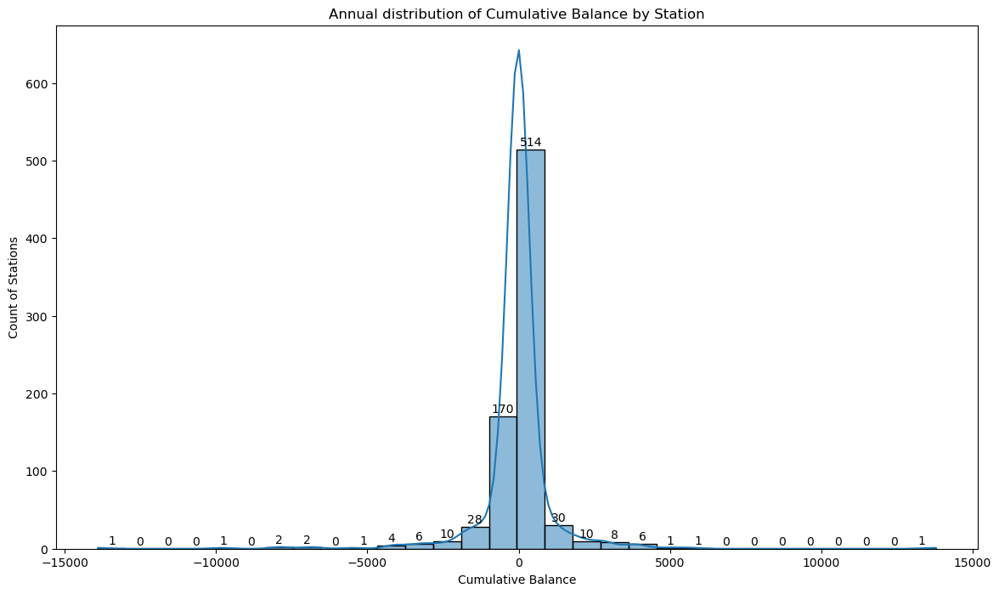

In [12]:
# Generate a histogram plot using seaborn
plt.figure(figsize=(14, 8))
sns.histplot(data=df_cumulative_balance, x='CUMULATIVE_BALANCE', bins=30, kde=True)

# Set the title and labels
plt.title('Annual distribution of Cumulative Balance by Station')
plt.xlabel('Cumulative Balance')
plt.ylabel('Count of Stations')

# Add values on top of each bar, further away from the top end
for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 5.0), ha='center', va='baseline')

# Show the plot
plt.show()

In [13]:
# df_cumulative_balance[df_cumulative_balance['CUMULATIVE_BALANCE'] > 450]
# equates to 111 rows if criteria is set to +90 (= +1/day over 90 days)
# equates to 72 rows if criteria is set to +180 (= +2/day over 90 days)
# equates to 55 rows if criteria is set to +270 (= +3/day over 90 days)
# equates to 46 rows if criteria is set to +360 (= +4/day over 90 days)
# equates to 32 rows if criteria is set to +450 (= +5/day over 90 days)


df_cumulative_balance[df_cumulative_balance['CUMULATIVE_BALANCE'] < -450]
# equates to 111 rows if criteria is set to -90 (= -1/day over 90 days)
# equates to 72 rows if criteria is set to -180 (= -2/day over 90 days)
# equates to 53 rows if criteria is set to -270 (= -3/day over 90 days)
# equates to 37 rows if criteria is set to -360 (= -4/day over 90 days)
# equates to 27 rows if criteria is set to -450 (= -5/day over 90 days)

,STATION,LAT,LNG,CUMULATIVE_BALANCE
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0
...,...,...,...,...
80,7th & Monroe St NE,38.932243,-76.996133,-496.0
81,Georgia & Missouri Ave NW,38.961339,-77.027855,-491.0
82,3rd & Elm St NW,38.917622,-77.015970,-453.0
83,7th St & Massachusetts Ave NE,38.892220,-76.996020,-452.0


In [14]:
# import csv file capacity_data.csv
df_capacity = pd.read_csv('capacity_data.csv', sep=';')
df_capacity.tail()

,start_station_name,capacity
832,Radford St & Osage St,15
833,Montgomery & East Ln,15
834,Marion Barry Ave & Naylor Rd SE,15
835,Motivate BX Tech office,15
836,tech trailer V-1,15


In [15]:
# compare row values in column start_station_name of dataframe df_capacity with row values in column STATION of dataframe df_cumulative_balance and print the mis-matches
# Compare STATION in df_cumulative_balance with start_station_name in df_capacity and print mismatches
mismatches = df_cumulative_balance[~df_cumulative_balance['STATION'].isin(df_capacity['start_station_name'])]
# print("Mismatches:\n", mismatches)
mismatches

,STATION,LAT,LNG,CUMULATIVE_BALANCE


In [16]:
# Similar to code section above execute code to show both stations only in df_cumulative
# filtered_stations1 = df_cumulative_balance[df_cumulative_balance['STATION'].isin(['3rd & M St SE', '3rd & M St NE'])]
# 14 min apart,i.e. not same stations
# filtered_stations1 = df_cumulative_balance[df_cumulative_balance['STATION'].isin(['3rd & N St NE', '3rd & M St NE'])]
# filtered_stations1

In [17]:
df_cumulative_balance

,STATION,LAT,LNG,CUMULATIVE_BALANCE
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0
...,...,...,...,...
790,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0
791,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0
792,23rd & M St NW,38.905303,-77.050264,5124.0
793,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0


MERGE CAPACITY DATA WITH CUMULATIVE BALANCE

In [18]:
# Merge df_cumulative_balance with df_capacity on the station name
df_cumulative_balance = df_cumulative_balance.merge(df_capacity, left_on='STATION', right_on='start_station_name', how='left')

# Rename the 'capacity' column to 'CAPACITY'
df_cumulative_balance.rename(columns={'capacity': 'CAPACITY'}, inplace=True)

# Drop the redundant 'start_station_name' column
df_cumulative_balance.drop(columns=['start_station_name'], inplace=True)

df_cumulative_balance


,STATION,LAT,LNG,CUMULATIVE_BALANCE,CAPACITY
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0,39
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0,27
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0,35
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0,27
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0,23
...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0,17
792,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0,39
793,23rd & M St NW,38.905303,-77.050264,5124.0,19
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0,23


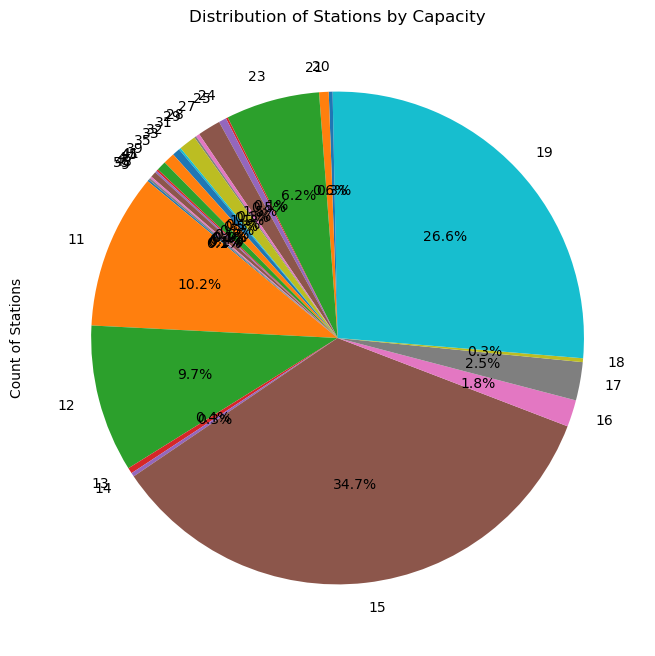

In [19]:
# Count the number of stations for each capacity value
capacity_counts = df_cumulative_balance['CAPACITY'].value_counts().sort_index()

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(capacity_counts, labels=capacity_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Stations by Capacity')
plt.ylabel('Count of Stations')
plt.show()

Used OpenOfficeCalc to see that 87% stations have capacity up to 21days, 15 days limit would only cover 56%

Development of calculation logic for imbalance categories:
1. Imbalance starts when whole station is full or empty
2. Hence, if I set limit at 21 bikes (+/-) then I have an accurate measurement (covers 87% of stations)
3. Even better way would be to calculate imbalance for each station capacity category individually () 

INTRODUCTION OF IMBALANCE FACTOR

In [20]:
# calculate an 'IMBALANCE FACTOR' for each row in df_cumulative_balance. Take value in 'CUMULATIVE_BALANCE' and divide by 52, then take the result and divide it by the value in column 'CAPACITY' in same. Result of this calculation should be put as float with one decimal in the new column 'IMBALANCE FACTOR' 
df_cumulative_balance['IMBALANCE_FACTOR'] = (df_cumulative_balance['CUMULATIVE_BALANCE'] / 52 / df_cumulative_balance['CAPACITY']).round(1)
df_cumulative_balance

,STATION,LAT,LNG,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0,39,-6.9
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0,27,-7.0
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0,35,-4.3
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0,27,-5.6
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0,23,-5.8
...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0,17,4.4
792,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0,39,2.2
793,23rd & M St NW,38.905303,-77.050264,5124.0,19,5.2
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0,23,4.7


In [21]:
df_cumulative_balance['IMB_FAC_CATEGORY'] = df_cumulative_balance['IMBALANCE_FACTOR'].apply(
    lambda x: 'too_few' if x < -0.5 else ('balanced' if x <= 0.5 else 'too_many')
)
df_cumulative_balance

,STATION,LAT,LNG,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY
0,11th & Kenyon St NW,38.929464,-77.027822,-13906.0,39,-6.9,too_few
1,14th & Otis Pl NW,38.934405,-77.032687,-9830.0,27,-7.0,too_few
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,-7882.0,35,-4.3,too_few
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,-7870.0,27,-5.6,too_few
4,18th St & Wyoming Ave NW,38.918809,-77.041571,-6939.0,23,-5.8,too_few
...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,3926.0,17,4.4,too_many
792,17th & K St NW / Farragut Square,38.902061,-77.038322,4512.0,39,2.2,too_many
793,23rd & M St NW,38.905303,-77.050264,5124.0,19,5.2,too_many
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,5679.0,23,4.7,too_many


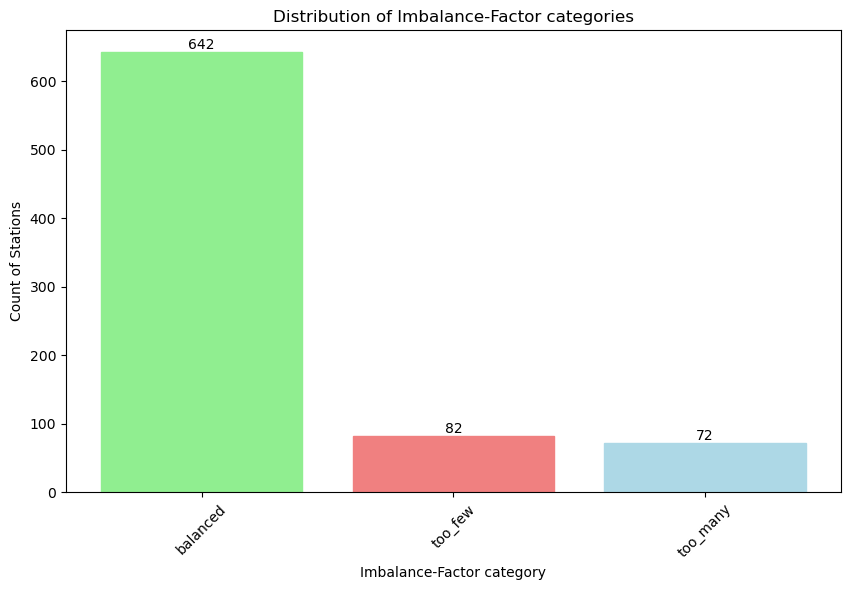

In [22]:
# Define the color scheme
# Count the number of stations in each IMB_FAC_CATEGORY
imb_fac_category_counts = df_cumulative_balance['IMB_FAC_CATEGORY'].value_counts()

# Plot the distribution as a bar chart
plt.figure(figsize=(10, 6))
ax = plt.gca()
bars = ax.bar(imb_fac_category_counts.index, imb_fac_category_counts.values)

# Apply colors to each bar based on its category
for bar, category in zip(bars, imb_fac_category_counts.index):
    color_scheme = {'balanced': 'lightgreen', 'too_few': 'lightcoral', 'too_many': 'lightblue'}
    bar.set_color(color_scheme[category])

plt.title('Distribution of Imbalance-Factor categories')
plt.xlabel('Imbalance-Factor category')
plt.ylabel('Count of Stations')
plt.xticks(rotation=45)

# Add values on top of each bar, further away from the top end
for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 5.0), ha='center', va='baseline')

plt.show()

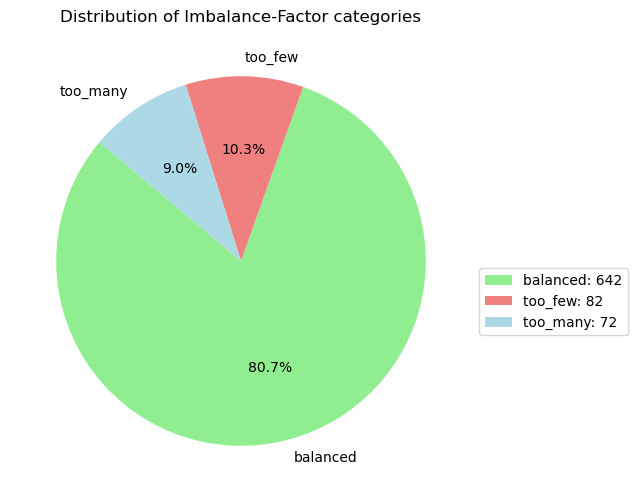

In [23]:
# Count the number of stations in each IMB_FAC_CATEGORY
imb_fac_category_counts = df_cumulative_balance['IMB_FAC_CATEGORY'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
imb_fac_category_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colors=['lightgreen', 'lightcoral', 'lightblue'])
plt.title('Distribution of Imbalance-Factor categories')
plt.ylabel('')  # Hide the y-label

# Add a legend with the counts
legend_labels = [f'{category}: {count}' for category, count in imb_fac_category_counts.items()]
plt.legend(legend_labels, loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()


In [24]:
# bring in previously calculated values for 'COUNT_PICKUP' and 'COUNT_RETURN' by station and put them between columns 'LNG' and 'CUMULATIVE_BALANCE' 
# Merge previously calculated values for 'COUNT_PICKUP' and 'COUNT_RETURN' by station
df_counts = df_2_unique.groupby('STATION')[['COUNT_PICKUP', 'COUNT_RETURN']].sum().reset_index()

# Merge the counts into df_cumulative_balance
df_cumulative_balance = df_cumulative_balance.merge(df_counts, on='STATION', how='left')

# Reorder columns to place 'COUNT_PICKUP' and 'COUNT_RETURN' between 'LNG' and 'CUMULATIVE_BALANCE'
df_cumulative_balance = df_cumulative_balance[['STATION', 'LAT', 'LNG', 'COUNT_PICKUP', 'COUNT_RETURN', 
                                               'CUMULATIVE_BALANCE', 'CAPACITY', 'IMBALANCE_FACTOR', 
                                               'IMB_FAC_CATEGORY']]
df_cumulative_balance

,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY
0,11th & Kenyon St NW,38.929464,-77.027822,41626.0,27720.0,-13906.0,39,-6.9,too_few
1,14th & Otis Pl NW,38.934405,-77.032687,28304.0,18474.0,-9830.0,27,-7.0,too_few
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,19380.0,11498.0,-7882.0,35,-4.3,too_few
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,25646.0,17776.0,-7870.0,27,-5.6,too_few
4,18th St & Wyoming Ave NW,38.918809,-77.041571,69573.0,62634.0,-6939.0,23,-5.8,too_few
...,...,...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,13066.0,16992.0,3926.0,17,4.4,too_many
792,17th & K St NW / Farragut Square,38.902061,-77.038322,43557.0,48069.0,4512.0,39,2.2,too_many
793,23rd & M St NW,38.905303,-77.050264,38756.0,43880.0,5124.0,19,5.2,too_many
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,77076.0,82755.0,5679.0,23,4.7,too_many


INTRODUCTION OF TURNOVER

In [25]:
# introduce new calculation
df_cumulative_balance['TURNOVER'] = ((df_cumulative_balance['COUNT_PICKUP'] / 365) / df_cumulative_balance['CAPACITY']).round(1)
df_cumulative_balance



,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY,TURNOVER
0,11th & Kenyon St NW,38.929464,-77.027822,41626.0,27720.0,-13906.0,39,-6.9,too_few,2.9
1,14th & Otis Pl NW,38.934405,-77.032687,28304.0,18474.0,-9830.0,27,-7.0,too_few,2.9
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,19380.0,11498.0,-7882.0,35,-4.3,too_few,1.5
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,25646.0,17776.0,-7870.0,27,-5.6,too_few,2.6
4,18th St & Wyoming Ave NW,38.918809,-77.041571,69573.0,62634.0,-6939.0,23,-5.8,too_few,8.3
...,...,...,...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,13066.0,16992.0,3926.0,17,4.4,too_many,2.1
792,17th & K St NW / Farragut Square,38.902061,-77.038322,43557.0,48069.0,4512.0,39,2.2,too_many,3.1
793,23rd & M St NW,38.905303,-77.050264,38756.0,43880.0,5124.0,19,5.2,too_many,5.6
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,77076.0,82755.0,5679.0,23,4.7,too_many,9.2


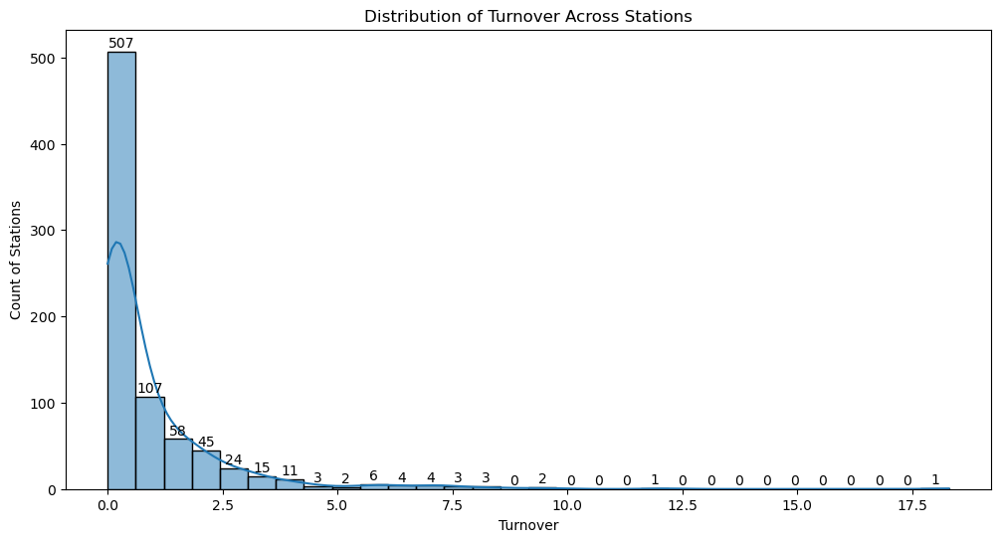

In [26]:
# create a histplot using count of stations on y-axis and turnover on x-axis
plt.figure(figsize=(12, 6))
sns.histplot(data=df_cumulative_balance, x='TURNOVER', bins=30, kde=True)
plt.xlabel('Turnover')
plt.ylabel('Count of Stations')
plt.title('Distribution of Turnover Across Stations')

# Add values on top of each bar, further away from the top end
for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 5.0), ha='center', va='baseline')

plt.show()

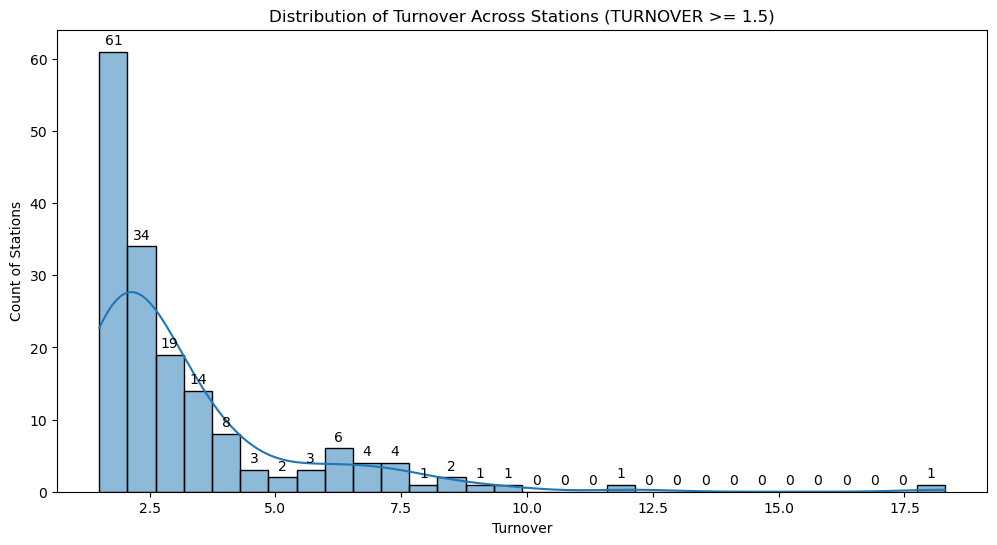

In [27]:
# Filter the dataframe to include only records with TURNOVER >= 1.5
df_filtered = df_cumulative_balance[df_cumulative_balance['TURNOVER'] >= 1.5]

# Create a histplot using count of stations on y-axis and turnover on x-axis
plt.figure(figsize=(12, 6))
sns.histplot(data=df_filtered, x='TURNOVER', bins=30, kde=True)
plt.xlabel('Turnover')
plt.ylabel('Count of Stations')
plt.title('Distribution of Turnover Across Stations (TURNOVER >= 1.5)')

# Add values on top of each bar, further away from the top end
for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 1.0), ha='center', va='baseline')

plt.show()

In [28]:
def categorize_turnover(turnover):
    if turnover > 2:
        return 'highly-utilized'
    elif 0.33 <= turnover <= 2:
        return 'well-utilized'
    else:
        return 'under-utilized'

df_cumulative_balance['TO_CATEGORY'] = df_cumulative_balance['TURNOVER'].apply(categorize_turnover)
df_cumulative_balance


,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY,TURNOVER,TO_CATEGORY
0,11th & Kenyon St NW,38.929464,-77.027822,41626.0,27720.0,-13906.0,39,-6.9,too_few,2.9,highly-utilized
1,14th & Otis Pl NW,38.934405,-77.032687,28304.0,18474.0,-9830.0,27,-7.0,too_few,2.9,highly-utilized
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,19380.0,11498.0,-7882.0,35,-4.3,too_few,1.5,well-utilized
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,25646.0,17776.0,-7870.0,27,-5.6,too_few,2.6,highly-utilized
4,18th St & Wyoming Ave NW,38.918809,-77.041571,69573.0,62634.0,-6939.0,23,-5.8,too_few,8.3,highly-utilized
...,...,...,...,...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,13066.0,16992.0,3926.0,17,4.4,too_many,2.1,highly-utilized
792,17th & K St NW / Farragut Square,38.902061,-77.038322,43557.0,48069.0,4512.0,39,2.2,too_many,3.1,highly-utilized
793,23rd & M St NW,38.905303,-77.050264,38756.0,43880.0,5124.0,19,5.2,too_many,5.6,highly-utilized
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,77076.0,82755.0,5679.0,23,4.7,too_many,9.2,highly-utilized


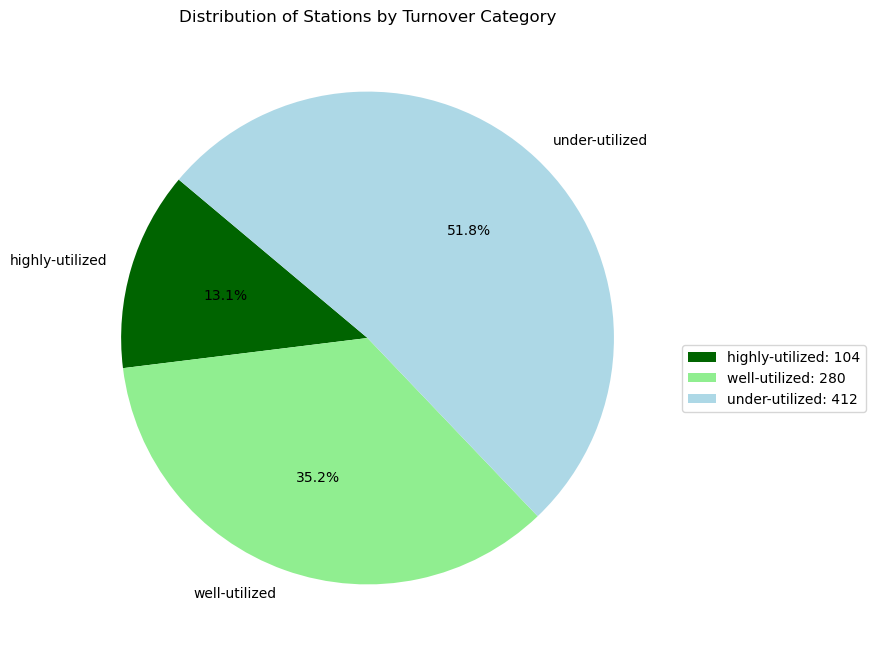

In [29]:
# Define the order and color scheme
category_order = ['highly-utilized', 'well-utilized', 'under-utilized']
category_colors = {
    'highly-utilized': 'darkgreen',
    'well-utilized': 'lightgreen',
    'under-utilized': 'lightblue',
}

# Count the number of stations in each turnover category
category_counts = df_cumulative_balance['TO_CATEGORY'].value_counts().reindex(category_order)

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=[category_colors[cat] for cat in category_order])
plt.title('Distribution of Stations by Turnover Category')

# Add a legend with the counts
legend_labels = [f'{category}: {count}' for category, count in category_counts.items()]
plt.legend(legend_labels, loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()

INTRODUCTION OF CROSS-CATEGORIES

In [30]:
# build cross-category
df_cumulative_balance['TO_IMB_CATEGORY'] = df_cumulative_balance['TO_CATEGORY'] + '__' + df_cumulative_balance['IMB_FAC_CATEGORY']
df_cumulative_balance

,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY,TURNOVER,TO_CATEGORY,TO_IMB_CATEGORY
0,11th & Kenyon St NW,38.929464,-77.027822,41626.0,27720.0,-13906.0,39,-6.9,too_few,2.9,highly-utilized,highly-utilized__too_few
1,14th & Otis Pl NW,38.934405,-77.032687,28304.0,18474.0,-9830.0,27,-7.0,too_few,2.9,highly-utilized,highly-utilized__too_few
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,19380.0,11498.0,-7882.0,35,-4.3,too_few,1.5,well-utilized,well-utilized__too_few
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,25646.0,17776.0,-7870.0,27,-5.6,too_few,2.6,highly-utilized,highly-utilized__too_few
4,18th St & Wyoming Ave NW,38.918809,-77.041571,69573.0,62634.0,-6939.0,23,-5.8,too_few,8.3,highly-utilized,highly-utilized__too_few
...,...,...,...,...,...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,13066.0,16992.0,3926.0,17,4.4,too_many,2.1,highly-utilized,highly-utilized__too_many
792,17th & K St NW / Farragut Square,38.902061,-77.038322,43557.0,48069.0,4512.0,39,2.2,too_many,3.1,highly-utilized,highly-utilized__too_many
793,23rd & M St NW,38.905303,-77.050264,38756.0,43880.0,5124.0,19,5.2,too_many,5.6,highly-utilized,highly-utilized__too_many
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,77076.0,82755.0,5679.0,23,4.7,too_many,9.2,highly-utilized,highly-utilized__too_many


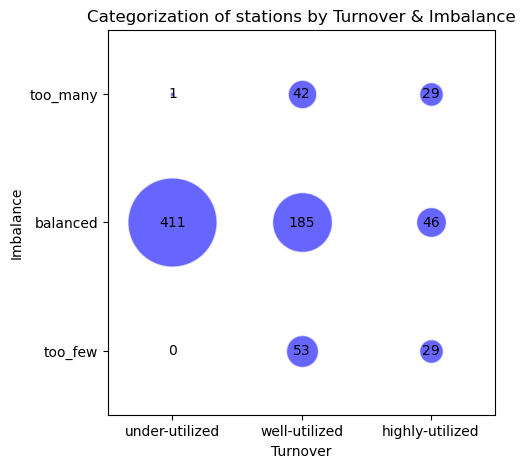

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the categories for the x and y axes
to_categories = ['under-utilized', 'well-utilized', 'highly-utilized']
imb_fac_categories = ['too_few', 'balanced', 'too_many']

# Create a DataFrame to store the counts
counts = pd.DataFrame(0, index=imb_fac_categories, columns=to_categories)

# Count the number of stations in each cross-category
for to_cat in to_categories:
    for imb_fac_cat in imb_fac_categories:
        counts.loc[imb_fac_cat, to_cat] = df_cumulative_balance[
            (df_cumulative_balance['TO_CATEGORY'] == to_cat) & 
            (df_cumulative_balance['IMB_FAC_CATEGORY'] == imb_fac_cat)
        ].shape[0]

# Create the plot
fig, ax = plt.subplots(figsize=(5, 5))

# Create a scatter plot with circle sizes based on the counts and color 'blue'
for i, imb_fac_cat in enumerate(imb_fac_categories):
    for j, to_cat in enumerate(to_categories):
        count = counts.loc[imb_fac_cat, to_cat]
        ax.scatter(j, i, s=count*10, alpha=0.6, edgecolors='w', color='blue')
        ax.text(j, i, count, ha='center', va='center', color='black')

# Set the x and y axis labels
ax.set_xticks(range(len(to_categories)))
ax.set_xticklabels(to_categories)
ax.set_yticks(range(len(imb_fac_categories)))
ax.set_yticklabels(imb_fac_categories)

# Set the axis labels
ax.set_xlabel('Turnover')
ax.set_ylabel('Imbalance')

# Set the title
ax.set_title('Categorization of stations by Turnover & Imbalance')

# Adjust the x and y limits to add padding
ax.set_xlim(-0.5, len(to_categories) - 0.5)
ax.set_ylim(-0.5, len(imb_fac_categories) - 0.5)

plt.show()


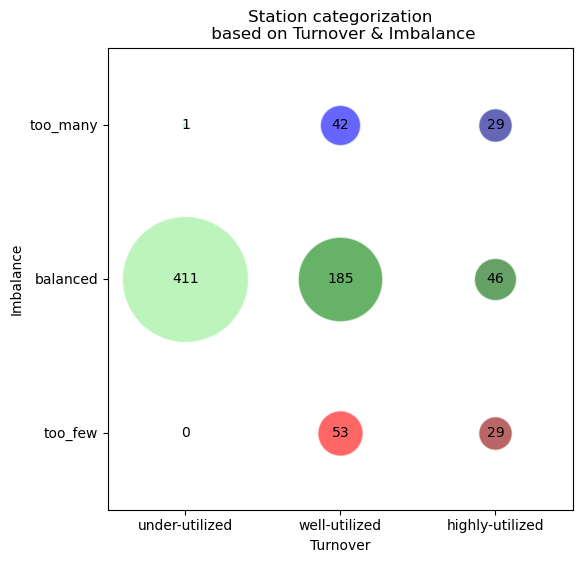

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the categories for the x and y axes
to_categories = ['under-utilized', 'well-utilized', 'highly-utilized']
imb_fac_categories = ['too_few', 'balanced', 'too_many']

# Create a DataFrame to store the counts
counts = pd.DataFrame(0, index=imb_fac_categories, columns=to_categories)

# Count the number of stations in each cross-category
for to_cat in to_categories:
    for imb_fac_cat in imb_fac_categories:
        counts.loc[imb_fac_cat, to_cat] = df_cumulative_balance[
            (df_cumulative_balance['TO_CATEGORY'] == to_cat) & 
            (df_cumulative_balance['IMB_FAC_CATEGORY'] == imb_fac_cat)
        ].shape[0]

# Create the plot
fig, ax = plt.subplots(figsize=(6, 6))

# Define the color scheme for each quadrant
color_scheme = {
    ('too_many', 'under-utilized'): 'lightblue',
    ('too_many', 'well-utilized'): 'blue',
    ('too_many', 'highly-utilized'): 'darkblue',
    ('balanced', 'under-utilized'): 'lightgreen',
    ('balanced', 'well-utilized'): 'green',
    ('balanced', 'highly-utilized'): 'darkgreen',
    ('too_few', 'under-utilized'): 'lightcoral',
    ('too_few', 'well-utilized'): 'red',
    ('too_few', 'highly-utilized'): 'darkred'
}

# Create a scatter plot with circle sizes based on the counts and fixed color scheme
for i, imb_fac_cat in enumerate(imb_fac_categories):
    for j, to_cat in enumerate(to_categories):
        count = counts.loc[imb_fac_cat, to_cat]
        color = color_scheme.get((imb_fac_cat, to_cat), 'white')  # Use 'white' for no values
        ax.scatter(j, i, s=count*10*2.0, alpha=0.6, edgecolors='w', color=color)  # Increase size by 25%
        ax.text(j, i, count, ha='center', va='center', color='black')

# Set the x and y axis labels
ax.set_xticks(range(len(to_categories)))
ax.set_xticklabels(to_categories)
ax.set_yticks(range(len(imb_fac_categories)))
ax.set_yticklabels(imb_fac_categories)

# Set the axis labels
ax.set_xlabel('Turnover')
ax.set_ylabel('Imbalance')

# Set the title
ax.set_title('Station categorization\n based on Turnover & Imbalance')

# Adjust the x and y limits to add padding
ax.set_xlim(-0.5, len(to_categories) - 0.5)
ax.set_ylim(-0.5, len(imb_fac_categories) - 0.5)

plt.show()

In [33]:
import folium

# Next step, 
# Create a base map
m = folium.Map(location=[df_cumulative_balance['LAT'].mean(), df_cumulative_balance['LNG'].mean()], zoom_start=12)

# Function to determine color based on TO_IMB_CATEGORY
def get_color(to_imb_category):
    return color_scheme.get(to_imb_category, 'blue')

# Add stations to the map
for _, row in df_cumulative_balance.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LNG']],
        radius=5 + abs(row['IMBALANCE_FACTOR']) * 5,  # Scale the size based on IMBALANCE_FACTOR
        color=get_color((row['IMB_FAC_CATEGORY'], row['TO_CATEGORY'])),
        fill=True,
        fill_color=get_color((row['IMB_FAC_CATEGORY'], row['TO_CATEGORY'])),
        fill_opacity=0.6,
        popup=f"Station: {row['STATION']}\nTurnover: {row['TURNOVER']:.2f}\nImbalance Factor: {row['IMBALANCE_FACTOR']:.2f}"
    ).add_to(m)

# Create a legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 240px; height: 210px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;
            ">
&emsp;<b>Legend</b><br>
&emsp;<i class="fa fa-circle" style="color:lightblue"></i>&emsp;Too Many - Under-utilized<br>
&emsp;<i class="fa fa-circle" style="color:blue"></i>&emsp;Too Many - Well-utilized<br>
&emsp;<i class="fa fa-circle" style="color:darkblue"></i>&emsp;Too Many - Highly-utilized<br>
&emsp;<i class="fa fa-circle" style="color:lightgreen"></i>&emsp;Balanced - Under-utilized<br>
&emsp;<i class="fa fa-circle" style="color:green"></i>&emsp;Balanced - Well-utilized<br>
&emsp;<i class="fa fa-circle" style="color:darkgreen"></i>&emsp;Balanced - Highly-utilized<br>
&emsp;<i class="fa fa-circle" style="color:lightcoral"></i>&emsp;Too Few - Under-utilized<br>
&emsp;<i class="fa fa-circle" style="color:red"></i>&emsp;Too Few - Well-utilized<br>
&emsp;<i class="fa fa-circle" style="color:darkred"></i>&emsp;Too Few - Highly-utilized
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m
# (only eight exist) categories onto the map to offer visual aid for re-balancing



In [34]:
import folium

# Create a base map
m = folium.Map(location=[df_cumulative_balance['LAT'].mean(), df_cumulative_balance['LNG'].mean()], zoom_start=12)

# Function to determine color based on turnover category
def get_color(turnover_category):
    category_colors = {
        'highly-utilized': 'darkred',
        'healthy': 'green',
        'medium': 'lightgreen',
        'under-utiltized': 'lightgrey',
        'excess-capacity': 'grey'
    }
    return category_colors.get(turnover_category, 'blue')

# Add stations to the map
for _, row in df_cumulative_balance.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LNG']],
        radius=5 + row['TURNOVER'] * 5,  # Adjust the size based on turnover
        color=get_color(row['TO_CATEGORY']),
        fill=True,
        fill_color=get_color(row['TO_CATEGORY']),
        fill_opacity=0.6,
        popup=f"Station: {row['STATION']}\nTurnover: {row['TURNOVER']:.2f}\nCategory: {row['TO_CATEGORY']}"
    ).add_to(m)

# Display the map
m


In [35]:
# Create a base map
m1 = folium.Map(location=[df_cumulative_balance['LAT'].mean(), df_cumulative_balance['LNG'].mean()], zoom_start=12)

# Function to determine color based on turnover category
def get_color(turnover_category):
    category_colors = {
        'highly-utilized': 'darkred',
        'healthy': 'green',
        'medium': 'lightgreen',
        'under-utiltized': 'lightgrey',
        'excess-capacity': 'grey'
    }
    return category_colors.get(turnover_category, 'blue')

# Add stations to the map
for _, row in df_cumulative_balance.iterrows():
    # Scale the turnover values to a range between 1 and 20
    scaled_turnover = 1 + (row['TURNOVER'] - df_cumulative_balance['TURNOVER'].min()) * (20 - 1) / (df_cumulative_balance['TURNOVER'].max() - df_cumulative_balance['TURNOVER'].min())
    
    folium.CircleMarker(
        location=[row['LAT'], row['LNG']],
        radius=scaled_turnover,  # Use the scaled turnover for the radius
        color=get_color(row['TO_CATEGORY']),
        fill=True,
        fill_color=get_color(row['TO_CATEGORY']),
        fill_opacity=0.6,
        popup=f"Station: {row['STATION']}\nTurnover: {row['TURNOVER']:.2f}\nCategory: {row['TO_CATEGORY']}"
    ).add_to(m1)

# Create a legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 150px; height: 150px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;
            ">
&emsp;<b>Legend</b><br>
&emsp;<i class="fa fa-circle" style="color:darkred"></i>&emsp;Highly-utilized<br>
&emsp;<i class="fa fa-circle" style="color:green"></i>&emsp;Healthy<br>
&emsp;<i class="fa fa-circle" style="color:lightgreen"></i>&emsp;Medium<br>
&emsp;<i class="fa fa-circle" style="color:lightgrey"></i>&emsp;Under-utilized<br>
&emsp;<i class="fa fa-circle" style="color:grey"></i>&emsp;Excess-capacity
</div>
'''

m1.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m1


In [65]:
from geopy.distance import geodesic

# Define the latitude and longitude coordinates of Washington DC
dc_coordinates = (38.907192, -77.046873)  # Adjusted Longitude by 1km to the south

# Function to calculate distance in kilometers
def calculate_distance(lat, lng):
    station_coordinates = (lat, lng)
    return geodesic(dc_coordinates, station_coordinates).kilometers

# Calculate the distance for each station and assign the new columns
df_cumulative_balance['distance_to_centre_km'] = df_cumulative_balance.apply(
    lambda row: round(calculate_distance(row['LAT'], row['LNG']), 1), axis=1
)

# Assign 'inside_outside' based on the distance
df_cumulative_balance['inside_outside'] = df_cumulative_balance['distance_to_centre_km'].apply(
    lambda x: 'in_centre' if x <= 11 else 'outside_centre'
)

df_cumulative_balance

,STATION,LAT,LNG,COUNT_PICKUP,COUNT_RETURN,CUMULATIVE_BALANCE,CAPACITY,IMBALANCE_FACTOR,IMB_FAC_CATEGORY,TURNOVER,TO_CATEGORY,TO_IMB_CATEGORY,distance_to_centre_km,inside_outside
0,11th & Kenyon St NW,38.929464,-77.027822,41626.0,27720.0,-13906.0,39,-6.9,too_few,2.9,highly-utilized,highly-utilized__too_few,3.0,in_centre
1,14th & Otis Pl NW,38.934405,-77.032687,28304.0,18474.0,-9830.0,27,-7.0,too_few,2.9,highly-utilized,highly-utilized__too_few,3.3,in_centre
2,Park Rd & Holmead Pl NW,38.930800,-77.031500,19380.0,11498.0,-7882.0,35,-4.3,too_few,1.5,well-utilized,well-utilized__too_few,2.9,in_centre
3,Columbia Rd & Georgia Ave NW,38.928121,-77.023795,25646.0,17776.0,-7870.0,27,-5.6,too_few,2.6,highly-utilized,highly-utilized__too_few,3.1,in_centre
4,18th St & Wyoming Ave NW,38.918809,-77.041571,69573.0,62634.0,-6939.0,23,-5.8,too_few,8.3,highly-utilized,highly-utilized__too_few,1.4,in_centre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,M St & New Jersey Ave SE,38.876300,-77.003700,13066.0,16992.0,3926.0,17,4.4,too_many,2.1,highly-utilized,highly-utilized__too_many,5.1,in_centre
792,17th & K St NW / Farragut Square,38.902061,-77.038322,43557.0,48069.0,4512.0,39,2.2,too_many,3.1,highly-utilized,highly-utilized__too_many,0.9,in_centre
793,23rd & M St NW,38.905303,-77.050264,38756.0,43880.0,5124.0,19,5.2,too_many,5.6,highly-utilized,highly-utilized__too_many,0.4,in_centre
794,Jefferson Dr & 14th St SW,38.888553,-77.032427,77076.0,82755.0,5679.0,23,4.7,too_many,9.2,highly-utilized,highly-utilized__too_many,2.4,in_centre


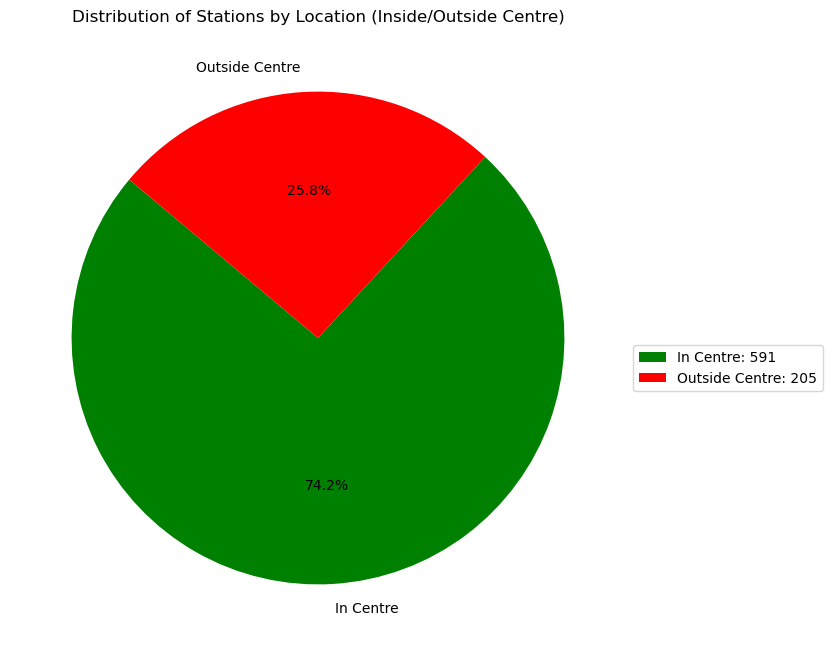

In [66]:
# Create a pie chart for 'inside_outside' category
plt.figure(figsize=(8, 8))
df_cumulative_balance['inside_outside'].value_counts().plot(
    kind='pie', 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=['green', 'red'], 
    labels=['In Centre', 'Outside Centre']
)

# Set the title
plt.title('Distribution of Stations by Location (Inside/Outside Centre)')
plt.ylabel('')  # Remove the y-axis label for better visualization

# Add a legend with the actual total count for each category
counts = df_cumulative_balance['inside_outside'].value_counts()
legend_labels = [f"In Centre: {counts['in_centre']}", f"Outside Centre: {counts['outside_centre']}"]
plt.legend(legend_labels, loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()

In [67]:
# Create a base map centered around Washington DC
m = folium.Map(location=[38.907192, -77.036873], zoom_start=12)

# Add a circle of 15km radius around the center of Washington DC
folium.Circle(
    location=[38.907192, -77.046873], # adjusted coordinate 1km to south
    radius=11000,
    color='blue',
    fill=True,
    fill_opacity=0.1,
    popup='11km Radius'
).add_to(m)

# Function to determine color based on 'inside_outside' column
def get_color(inside_outside):
    return 'green' if inside_outside == 'in_centre' else 'red'

# Add stations to the map
for _, row in df_cumulative_balance.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LNG']],
        radius=5,
        color=get_color(row['inside_outside']),
        fill=True,
        fill_color=get_color(row['inside_outside']),
        fill_opacity=0.6,
        popup=f"Station: {row['STATION']}\nDistance to Center: {row['distance_to_centre_km']} km\nCategory: {row['inside_outside']}"
    ).add_to(m)

# Add a legend to the map
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height: 90px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; opacity: 0.8;
            ">
&emsp;<b>Legend</b><br>
&emsp;<i class="fa fa-circle" style="color:green"></i>&emsp;In Centre<br>
&emsp;<i class="fa fa-circle" style="color:red"></i>&emsp;Outside Centre
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m

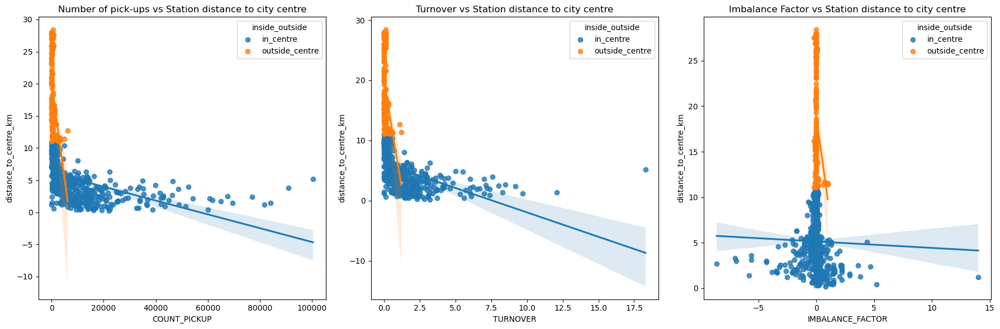

In [72]:
# Create a 1x3 grid of subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Define the hue variable and its unique values
hue_var = "inside_outside"
hue_values = df_cumulative_balance[hue_var].unique()
colors = sns.color_palette("tab10", len(hue_values))

# Plot 1: Correlation between apparent temperature and total rides
for hue_value, color in zip(hue_values, colors):
	subset = df_cumulative_balance[df_cumulative_balance[hue_var] == hue_value]
	sns.regplot(data=subset, x="COUNT_PICKUP", y="distance_to_centre_km", ax=axs[0], scatter_kws={'color': color}, line_kws={'color': color}, label=hue_value)
axs[0].set_title("Number of pick-ups vs Station distance to city centre")
axs[0].legend(title=hue_var)

# Plot 2: Correlation between temperature and member rides
for hue_value, color in zip(hue_values, colors):
	subset = df_cumulative_balance[df_cumulative_balance[hue_var] == hue_value]
	sns.regplot(data=subset, x="TURNOVER", y="distance_to_centre_km", ax=axs[1], scatter_kws={'color': color}, line_kws={'color': color}, label=hue_value)
axs[1].set_title("Turnover vs Station distance to city centre")
axs[1].legend(title=hue_var)

# Plot 3: Correlation between windspeed and casual rides
for hue_value, color in zip(hue_values, colors):
	subset = df_cumulative_balance[df_cumulative_balance[hue_var] == hue_value]
	sns.regplot(data=subset, x="IMBALANCE_FACTOR", y="distance_to_centre_km", ax=axs[2], scatter_kws={'color': color}, line_kws={'color': color}, label=hue_value)
axs[2].set_title("Imbalance Factor vs Station distance to city centre")
axs[2].legend(title=hue_var)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

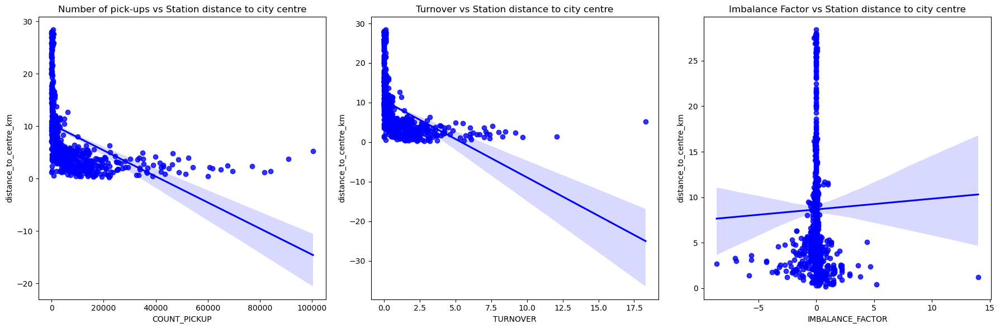

In [71]:
# Create a 1x3 grid of subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot 1: Correlation between station distance to city centre and number of pick-ups
sns.regplot(data=df_cumulative_balance, x="COUNT_PICKUP", y="distance_to_centre_km", ax=axs[0], scatter_kws={'color': 'blue'}, line_kws={'color': 'blue'})
axs[0].set_title("Number of pick-ups vs Station distance to city centre")

# Plot 2: Correlation between turnover and station distance to city centre
sns.regplot(data=df_cumulative_balance, x="TURNOVER", y="distance_to_centre_km", ax=axs[1], scatter_kws={'color': 'blue'}, line_kws={'color': 'blue'})
axs[1].set_title("Turnover vs Station distance to city centre")

# Plot 3: Correlation between imbalance factor and station distance to city centre
sns.regplot(data=df_cumulative_balance, x="IMBALANCE_FACTOR", y="distance_to_centre_km", ax=axs[2], scatter_kws={'color': 'blue'}, line_kws={'color': 'blue'})
axs[2].set_title("Imbalance Factor vs Station distance to city centre")

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


Placeholder for continuation

1. Build cross-categories, i.e. TO_CATEGORY and IMBALANCE_BY_AVG_WEEK(OR BY SEASON)
2. Change calculation method for balance to : # return - # pick-up
3. balance categories 
>= 5 then 'too_many_returns'
>1 & <5 then 'skewed_vs_returns'
>=-1 & <=1 then 'balanced'
>-5 & <-1 then 'skewed_vs_pick-ups'
<=-5 then 'too_many_pick-ups'
4. Considerations:

5 subcategories each will create 25 new cross-categories for merge it might be better to consolidate to 3 categories each.

Balance = <-2, -2 to +2, <+2
Logic = if balance > 2 on consistent basis then in one week station is empty or 'clogged'

Turnover <0,5 , 0,5 - 2,5 , >2,5
Logic = 3-4 as upper limit (we want bikes to be used more than once during the day...)




In [36]:
# to be used

In [37]:
# Aggregate by station and season the cumulative BALANCE for all days and sort results from lowest to highest value
df_cumulative_balance_season = df_2_unique.groupby(['STATION', 'SEASON', 'LAT', 'LNG'])['BALANCE'].sum().reset_index().sort_values(by='BALANCE')
df_cumulative_balance_season.rename(columns={'BALANCE': 'CUMULATIVE_BALANCE'}, inplace=True)
df_cumulative_balance_season

,STATION,SEASON,LAT,LNG,CUMULATIVE_BALANCE
64,11th & Kenyon St NW,Fall,38.929464,-77.027822,-3998.0
66,11th & Kenyon St NW,Summer,38.929464,-77.027822,-3902.0
194,14th & Otis Pl NW,Summer,38.934405,-77.032687,-3500.0
65,11th & Kenyon St NW,Spring,38.929464,-77.027822,-3360.0
192,14th & Otis Pl NW,Fall,38.934405,-77.032687,-3088.0
...,...,...,...,...,...
328,17th & K St NW / Farragut Square,Fall,38.902061,-77.038322,2013.0
1551,Georgetown Harbor / 30th St NW,Winter,38.902314,-77.059141,2328.0
1548,Georgetown Harbor / 30th St NW,Fall,38.902314,-77.059141,3100.0
1549,Georgetown Harbor / 30th St NW,Spring,38.902314,-77.059141,3780.0


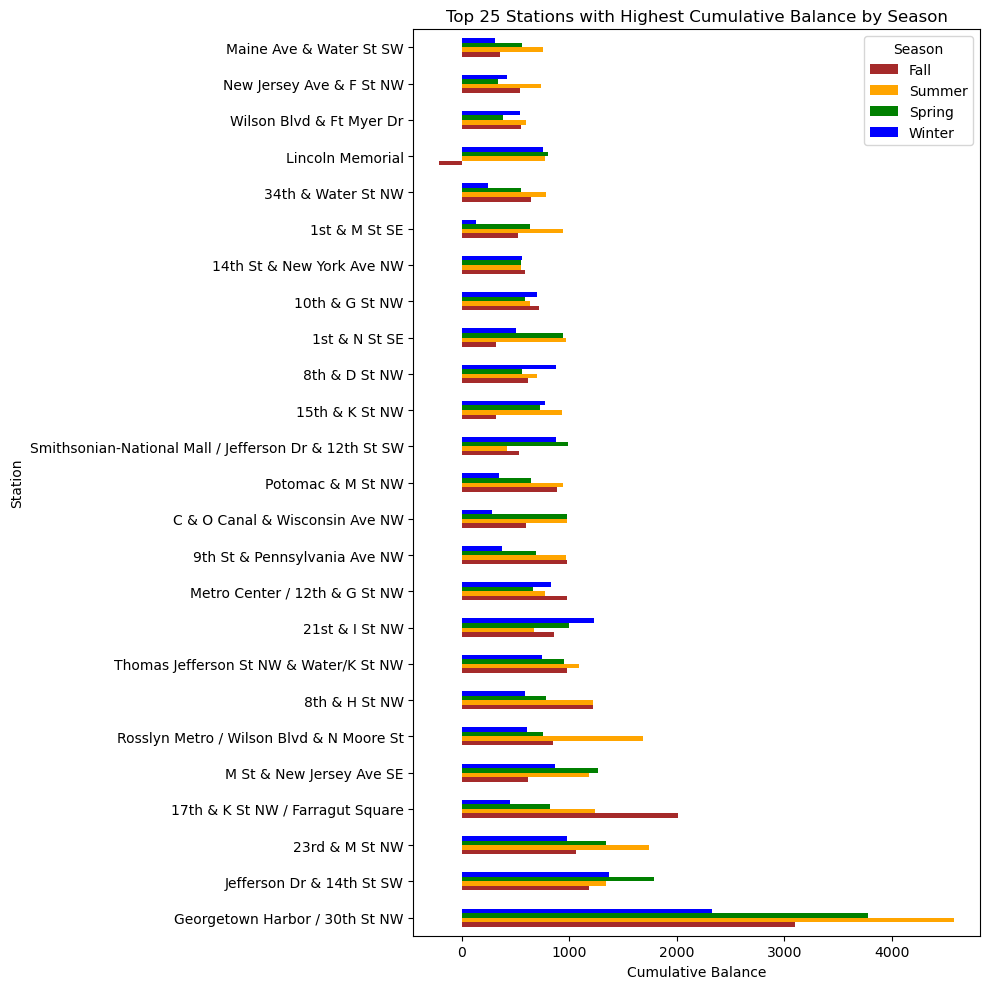

In [38]:
import matplotlib.pyplot as plt

# Define the order of seasons and their corresponding colors
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'brown'}

# Select the top 25 stations with the highest cumulative balance
top_25_stations = df_cumulative_balance.nlargest(25, 'CUMULATIVE_BALANCE')['STATION']

# Filter the df_cumulative_balance_season DataFrame to include only the top 25 stations
df_top_25_season = df_cumulative_balance_season[df_cumulative_balance_season['STATION'].isin(top_25_stations)]

# Pivot the DataFrame to have seasons as columns and stations as rows
df_pivot = df_top_25_season.pivot(index='STATION', columns='SEASON', values='CUMULATIVE_BALANCE')

# Reindex the columns to ensure the correct order of seasons
df_pivot = df_pivot[season_order]

# Sort the DataFrame by the cumulative balance per year
df_pivot = df_pivot.loc[top_25_stations]

# Plot the data with reversed season order
ax = df_pivot[season_order[::-1]].plot(kind='barh', figsize=(10, 10), color=[season_colors[season] for season in season_order[::-1]])
plt.title('Top 25 Stations with Highest Cumulative Balance by Season')
plt.xlabel('Cumulative Balance')
plt.ylabel('Station')
plt.legend(title='Season')
plt.tight_layout()
plt.show()

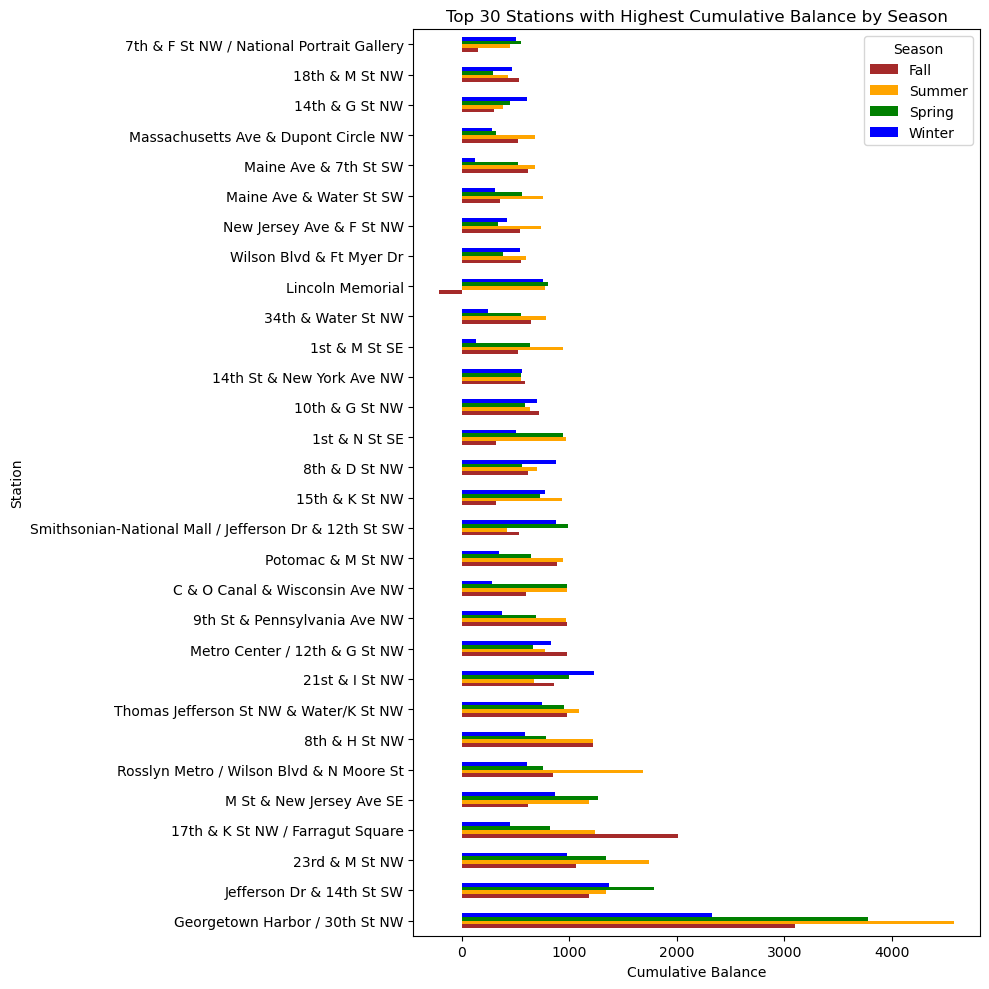

In [39]:
import matplotlib.pyplot as plt

# Define the order of seasons and their corresponding colors
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'brown'}

# Select the top 30 stations with the highest cumulative balance
top_30_stations = df_cumulative_balance.nlargest(30, 'CUMULATIVE_BALANCE')['STATION']

# Filter the df_cumulative_balance_season DataFrame to include only the top 25 stations
df_top_30_season = df_cumulative_balance_season[df_cumulative_balance_season['STATION'].isin(top_30_stations)]

# Pivot the DataFrame to have seasons as columns and stations as rows
df_pivot = df_top_30_season.pivot(index='STATION', columns='SEASON', values='CUMULATIVE_BALANCE')

# Reindex the columns to ensure the correct order of seasons
df_pivot = df_pivot[season_order]

# Sort the DataFrame by the cumulative balance per year
df_pivot = df_pivot.loc[top_30_stations]

# Plot the data with reversed season order
ax = df_pivot[season_order[::-1]].plot(kind='barh', figsize=(10, 10), color=[season_colors[season] for season in season_order[::-1]])
plt.title('Top 30 Stations with Highest Cumulative Balance by Season')
plt.xlabel('Cumulative Balance')
plt.ylabel('Station')
plt.legend(title='Season')
plt.tight_layout()
plt.show()

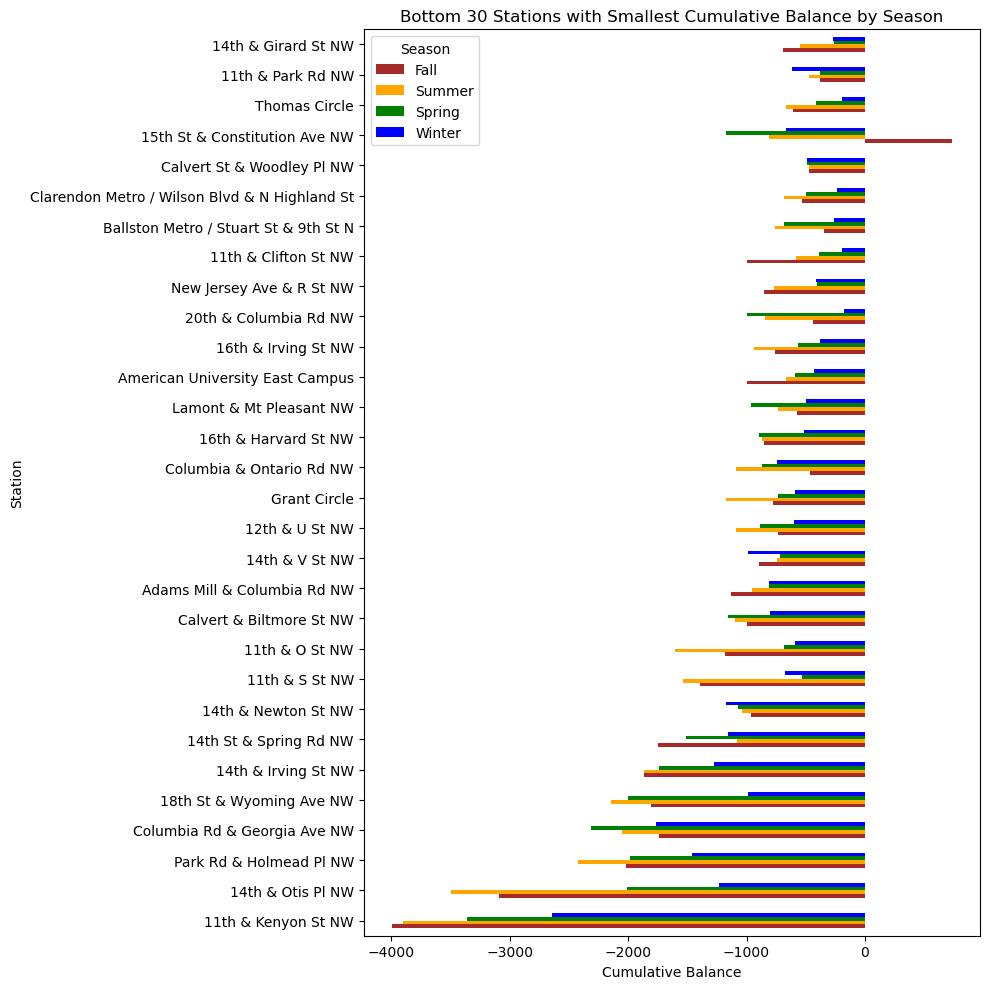

In [40]:
import matplotlib.pyplot as plt

# Define the order of seasons and their corresponding colors
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'brown'}

# Select the 30 stations with the smallest cumulative balance
bottom_30_stations = df_cumulative_balance.nsmallest(30, 'CUMULATIVE_BALANCE')['STATION']

# Filter the df_cumulative_balance_season DataFrame to include only the bottom 30 stations
df_bottom_30_season = df_cumulative_balance_season[df_cumulative_balance_season['STATION'].isin(bottom_30_stations)]

# Pivot the DataFrame to have seasons as columns and stations as rows
df_pivot = df_bottom_30_season.pivot(index='STATION', columns='SEASON', values='CUMULATIVE_BALANCE')

# Reindex the columns to ensure the correct order of seasons
df_pivot = df_pivot[season_order]

# Sort the DataFrame by the cumulative balance per year
df_pivot = df_pivot.loc[bottom_30_stations]

# Plot the data with reversed season order
ax = df_pivot[season_order[::-1]].plot(kind='barh', figsize=(10, 10), color=[season_colors[season] for season in season_order[::-1]])
plt.title('Bottom 30 Stations with Smallest Cumulative Balance by Season')
plt.xlabel('Cumulative Balance')
plt.ylabel('Station')
plt.legend(title='Season')
plt.tight_layout()
plt.show()

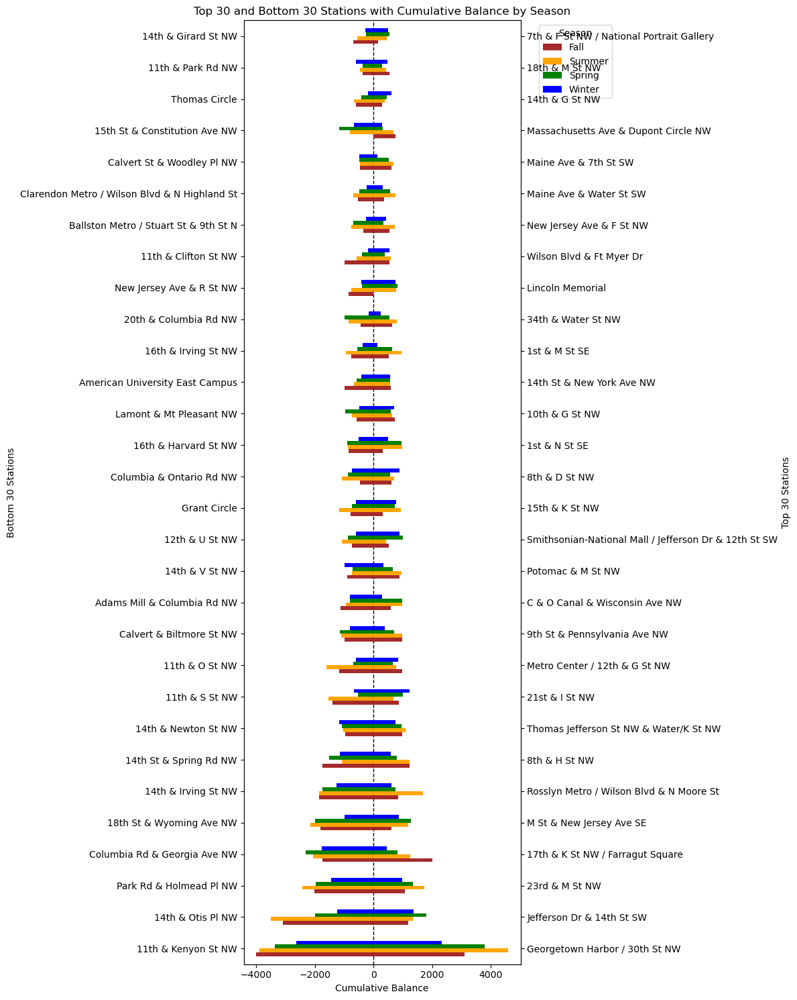

In [41]:
import matplotlib.pyplot as plt

# Define the order of seasons and their corresponding colors
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
season_colors = {'Winter': 'blue', 'Spring': 'green', 'Summer': 'orange', 'Fall': 'brown'}

# Select the top 30 and bottom 30 stations with the highest and smallest cumulative balance
top_30_stations = df_cumulative_balance.nlargest(30, 'CUMULATIVE_BALANCE')['STATION']
bottom_30_stations = df_cumulative_balance.nsmallest(30, 'CUMULATIVE_BALANCE')['STATION']

# Filter the df_cumulative_balance_season DataFrame to include only the top 30 and bottom 30 stations
df_top_30_season = df_cumulative_balance_season[df_cumulative_balance_season['STATION'].isin(top_30_stations)]
df_bottom_30_season = df_cumulative_balance_season[df_cumulative_balance_season['STATION'].isin(bottom_30_stations)]

# Combine the top 30 and bottom 30 dataframes
df_combined_season = pd.concat([df_top_30_season, df_bottom_30_season])

# Pivot the DataFrame to have seasons as columns and stations as rows
df_pivot = df_combined_season.pivot(index='STATION', columns='SEASON', values='CUMULATIVE_BALANCE')

# Reindex the columns to ensure the correct order of seasons
df_pivot = df_pivot[season_order]

# Sort the DataFrame by the cumulative balance per year
df_pivot = df_pivot.loc[bottom_30_stations.tolist() + top_30_stations.tolist()]

# Plot the data with reversed season order
fig, ax1 = plt.subplots(figsize=(12, 15))

# Plot bottom 30 stations
df_pivot.loc[bottom_30_stations, season_order[::-1]].plot(kind='barh', ax=ax1, color=[season_colors[season] for season in season_order[::-1]], legend=False)
ax1.set_ylabel('Bottom 30 Stations')
ax1.set_xlabel('Cumulative Balance')

# Create a second y-axis for the top 30 stations
ax2 = ax1.twinx()
df_pivot.loc[top_30_stations, season_order[::-1]].plot(kind='barh', ax=ax2, color=[season_colors[season] for season in season_order[::-1]], legend=False)
ax2.set_ylabel('Top 30 Stations')
ax2.set_yticks(ax1.get_yticks())
ax2.set_yticklabels(top_30_stations)

# Add a vertical line at X-Axis = 0
ax1.axvline(x=0, color='black', linestyle='--', linewidth=1)

# Set the title and legend
plt.title('Top 30 and Bottom 30 Stations with Cumulative Balance by Season')
ax1.legend(title='Season', loc='upper left', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

In [42]:
import numpy as np
import folium
from folium import plugins

In [43]:
# This map uses adjusted scale for each season

# Create a base map
m4 = folium.Map(location=[df_cumulative_balance_season['LAT'].mean(), df_cumulative_balance_season['LNG'].mean()], zoom_start=12)

# Function to determine color based on balance
def get_color(balance):
    if balance > 0:
        return 'blue'
    else:
        return 'red'

# Function to add stations to a feature group
def add_stations_to_group(group, stations, color, max_balance):
    for _, row in stations.iterrows():
        folium.CircleMarker(
            location=[row['LAT'], row['LNG']],
            radius=1 + (abs(row['CUMULATIVE_BALANCE']) / max_balance) * 10,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=f"Station: {row['STATION']}\nBalance: {row['CUMULATIVE_BALANCE']}"
        ).add_to(group)

# Create feature groups for each season
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
feature_groups = {season: folium.FeatureGroup(name=season, show=(season == 'Summer')) for season in seasons}

# Add stations to each feature group
for season in seasons:
    season_stations = df_cumulative_balance_season[df_cumulative_balance_season['SEASON'] == season]
    
    # Create dataframes for top 50, bottom 50, and the rest
    top_50_stations = season_stations.nlargest(50, 'CUMULATIVE_BALANCE')
    bottom_50_stations = season_stations.nsmallest(50, 'CUMULATIVE_BALANCE')
    remaining_stations = season_stations[~season_stations['STATION'].isin(top_50_stations['STATION']) & ~season_stations['STATION'].isin(bottom_50_stations['STATION'])]
    
    # Calculate max balance for scaling
    max_balance = max(abs(season_stations['CUMULATIVE_BALANCE'].max()), abs(season_stations['CUMULATIVE_BALANCE'].min()))
    
    # Add stations to the feature group
    add_stations_to_group(feature_groups[season], top_50_stations, 'blue', max_balance)
    add_stations_to_group(feature_groups[season], bottom_50_stations, 'red', max_balance)
    add_stations_to_group(feature_groups[season], remaining_stations, 'green', max_balance)

# Add feature groups to the map
for season, group in feature_groups.items():
    group.add_to(m4)

# Add layer control to switch between seasons
folium.LayerControl(collapsed=False).add_to(m4)

# Display the map
m4

In [44]:
# This map uses same scale for all seasons


# Create a base map
m5 = folium.Map(location=[df_cumulative_balance_season['LAT'].mean(), df_cumulative_balance_season['LNG'].mean()], zoom_start=12)

# Function to determine color based on balance
def get_color(balance):
    if balance > 0:
        return 'blue'
    else:
        return 'red'

# Function to add stations to a feature group
def add_stations_to_group(group, stations, color, max_balance):
    for _, row in stations.iterrows():
        folium.CircleMarker(
            location=[row['LAT'], row['LNG']],
            radius=1 + (abs(row['CUMULATIVE_BALANCE']) / max_balance) * 10,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=f"Station: {row['STATION']}\nBalance: {row['CUMULATIVE_BALANCE']}"
        ).add_to(group)

# Create feature groups for each season
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
feature_groups = {season: folium.FeatureGroup(name=season, show=(season == 'Summer')) for season in seasons}

# Add stations to each feature group
for season in seasons:
    season_stations = df_cumulative_balance_season[df_cumulative_balance_season['SEASON'] == season]
    
    # Create dataframes for top 50, bottom 50, and the rest
    top_50_stations = season_stations.nlargest(50, 'CUMULATIVE_BALANCE')
    bottom_50_stations = season_stations.nsmallest(50, 'CUMULATIVE_BALANCE')
    remaining_stations = season_stations[~season_stations['STATION'].isin(top_50_stations['STATION']) & ~season_stations['STATION'].isin(bottom_50_stations['STATION'])]
    
    # Calculate max balance for scaling
    max_balance = max(abs(df_cumulative_balance_season['CUMULATIVE_BALANCE'].max()), abs(df_cumulative_balance_season['CUMULATIVE_BALANCE'].min()))
    
    # Add stations to the feature group
    add_stations_to_group(feature_groups[season], top_50_stations, 'blue', max_balance)
    add_stations_to_group(feature_groups[season], bottom_50_stations, 'red', max_balance)
    add_stations_to_group(feature_groups[season], remaining_stations, 'green', max_balance)

# Add feature groups to the map
for season, group in feature_groups.items():
    group.add_to(m5)

# Add layer control to switch between seasons
folium.LayerControl(collapsed=False).add_to(m5)

# Display the map
m5

In [45]:
# Aggregate by station and weekday the cumulative BALANCE for all days and sort results from lowest to highest value
df_cumulative_balance_weekday = df_2_unique.groupby(['STATION', 'WEEKDAY', 'LAT', 'LNG'])['BALANCE'].sum().reset_index().sort_values(by='BALANCE')
df_cumulative_balance_weekday.rename(columns={'BALANCE': 'CUMULATIVE_BALANCE'}, inplace=True)
df_cumulative_balance_weekday

,STATION,WEEKDAY,LAT,LNG,CUMULATIVE_BALANCE
33,11th & Kenyon St NW,yes,38.929464,-77.027822,-9854.0
97,14th & Otis Pl NW,yes,38.934405,-77.032687,-7126.0
595,Columbia Rd & Georgia Ave NW,yes,38.928121,-77.023795,-6066.0
1171,Park Rd & Holmead Pl NW,yes,38.930800,-77.031500,-5587.0
91,14th & Irving St NW,yes,38.928552,-77.032224,-5262.0
...,...,...,...,...,...
849,Jefferson Dr & 14th St SW,yes,38.888553,-77.032427,3684.0
277,23rd & M St NW,yes,38.905303,-77.050264,3782.0
165,17th & K St NW / Farragut Square,yes,38.902061,-77.038322,3945.0
774,Georgetown Harbor / 30th St NW,no,38.902314,-77.059141,4268.0


In [46]:
# This map uses same scale for all weekdays

# Create a base map
m6 = folium.Map(location=[df_cumulative_balance_weekday['LAT'].mean(), df_cumulative_balance_weekday['LNG'].mean()], zoom_start=12)

# Function to determine color based on balance
def get_color(balance):
    if balance > 0:
        return 'blue'
    else:
        return 'red'

# Function to add stations to a feature group
def add_stations_to_group(group, stations, color, max_balance):
    for _, row in stations.iterrows():
        folium.CircleMarker(
            location=[row['LAT'], row['LNG']],
            radius=1 + (abs(row['CUMULATIVE_BALANCE']) / max_balance) * 10,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=f"Station: {row['STATION']}\nBalance: {row['CUMULATIVE_BALANCE']}"
        ).add_to(group)

# Create feature groups for each weekday
weekdays = ['Yes', 'No']
feature_groups = {weekday: folium.FeatureGroup(name=weekday, show=(weekday == 'Yes')) for weekday in weekdays}

# Add stations to each feature group
for weekday in weekdays:
    weekday_stations = df_cumulative_balance_weekday[df_cumulative_balance_weekday['WEEKDAY'] == weekday]
    
    # Create dataframes for top 50, bottom 50, and the rest
    top_50_stations = weekday_stations.nlargest(50, 'CUMULATIVE_BALANCE')
    bottom_50_stations = weekday_stations.nsmallest(50, 'CUMULATIVE_BALANCE')
    remaining_stations = weekday_stations[~weekday_stations['STATION'].isin(top_50_stations['STATION']) & ~weekday_stations['STATION'].isin(bottom_50_stations['STATION'])]
    
    # Calculate max balance for scaling
    max_balance = max(abs(df_cumulative_balance_weekday['CUMULATIVE_BALANCE'].max()), abs(df_cumulative_balance_weekday['CUMULATIVE_BALANCE'].min()))
    
    # Add stations to the feature group
    add_stations_to_group(feature_groups[weekday], top_50_stations, 'blue', max_balance)
    add_stations_to_group(feature_groups[weekday], bottom_50_stations, 'red', max_balance)
    add_stations_to_group(feature_groups[weekday], remaining_stations, 'green', max_balance)

# Add feature groups to the map
for weekday, group in feature_groups.items():
    group.add_to(m6)

# Add layer control to switch between weekdays
folium.LayerControl(collapsed=False).add_to(m6)

# Display the map
m6


In [47]:
# Use df_2_unique and add to each line 'member_type'